In [1]:
from pathlib import Path

from adain_model import AdaINModel, AdaINLoss
from adain_datamodule import AdaINDataModule
from adain_trainer import AdaINTrainer

import os
os.environ["KERAS_BACKEND"] = "torch"
import keras
import torch

In [2]:
run_id = ''
train_epochs = 7
start_epoch = 0
dataset_size = 100000
lr = 1e-4
decay_rate = 5e-5
decay_steps = 1
style_loss_weight = 10
tv_weight = 1
additional_tags = {'Upsampling' : 'Nearest', 'Style_loss' : 'Gram_matrix'}

In [3]:
dm = AdaINDataModule(Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/unlabeled2017/"), Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/WikiArt/"), dataset_size=dataset_size, seed=4444, batch_size=8)
if run_id != '' :
    model = AdaINModel.load_from_mlflow(run_id, Path("D:/Python/ML Flow/mlruns"))
else :
    model = AdaINModel()
    model.compile(optimizer='adam')
if decay_rate != 0 :
    model.optimizer.learning_rate = keras.optimizers.schedules.InverseTimeDecay(initial_learning_rate=lr, decay_steps=decay_steps, decay_rate=decay_rate)
else :
    model.optimizer.learning_rate = lr
model.loss_ = AdaINLoss(style_loss_weight=style_loss_weight, tv_weight=tv_weight)

In [4]:
total_epochs = start_epoch + train_epochs
trainer = AdaINTrainer(model, dm, 'adam', mlflow_dir=Path("D:/Python/ML Flow/mlruns"), mlflow_tags={"Dataset size" : dataset_size, "Real training" : True, "Total epochs" : f'{total_epochs} ({10*total_epochs} Keras epochs)', "Start epoch" : start_epoch, **additional_tags})
trainer.train(epochs=10*train_epochs, steps_per_epoch=1000, log_every_n_epochs=10, validation_steps=200, test_steps=200)

Initiating datasets...
Compiling the model...
Model is ready to be trained
Training the model...


Epoch 1/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 2353285.2500 - val_loss: 1705148.5000
Epoch 2/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 584s 584ms/step - loss: 1276017.5000 - val_loss: 1115297.3750
Epoch 3/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 1085318.0000 - val_loss: 970532.3750
Epoch 4/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 924042.8125 - val_loss: 2995069.0000
Epoch 5/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 1700281.6250 - val_loss: 1238424.3750
Epoch 6/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 1205681.8750 - val_loss: 888676.3125
Epoch 7/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 984339.9375 - val_loss: 898645.3750
Epoch 8/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 928870.6250 - val_loss: 858824.0625
Epoch 9/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 1012536.1875 - val_loss: 926149.2500
Epoch 10/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 92263

Epoch 11/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 939352.8125 - val_loss: 828164.8125
Epoch 12/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 944056.2500 - val_loss: 946040.8125
Epoch 13/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 958328.3750 - val_loss: 753982.3750
Epoch 14/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 585s 585ms/step - loss: 785180.4375 - val_loss: 820702.9375
Epoch 15/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 771290.0000 - val_loss: 856880.7500
Epoch 16/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 842999.6875 - val_loss: 751476.5000
Epoch 17/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 571s 571ms/step - loss: 700202.3125 - val_loss: 694435.2500
Epoch 18/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 777619.3750 - val_loss: 678863.4375
Epoch 19/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 763097.9375 - val_loss: 693798.1875
Epoch 20/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 677633

Epoch 21/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 963934.1875 - val_loss: 717448.6250
Epoch 22/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 726078.6875 - val_loss: 779940.9375
Epoch 23/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 711892.0625 - val_loss: 716043.7500
Epoch 24/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 692726.1250 - val_loss: 723945.2500
Epoch 25/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 704733.0000 - val_loss: 694199.4375
Epoch 26/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 641379.2500 - val_loss: 649485.1875
Epoch 27/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 635628.6250 - val_loss: 710444.1875
Epoch 28/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 774027.3125 - val_loss: 649830.6250
Epoch 29/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 584s 584ms/step - loss: 648353.4375 - val_loss: 699432.8750
Epoch 30/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 584s 584ms/step - loss: 723815

Epoch 31/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 588357.8750 - val_loss: 659315.6250
Epoch 32/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 760122.5625 - val_loss: 659360.7500
Epoch 33/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 688390.3125 - val_loss: 632535.5625
Epoch 34/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 651371.1250 - val_loss: 583225.9375
Epoch 35/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 706866.0000 - val_loss: 605218.4375
Epoch 36/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 566278.6250 - val_loss: 567351.0625
Epoch 37/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 582015.6250 - val_loss: 539059.8125
Epoch 38/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 580ms/step - loss: 592468.9375 - val_loss: 610138.8125
Epoch 39/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 732049.0000 - val_loss: 585556.9375
Epoch 40/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 580ms/step - loss: 544159

Epoch 41/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 591384.6875 - val_loss: 567697.1875
Epoch 42/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 561962.6875 - val_loss: 730500.5000
Epoch 43/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 673408.4375 - val_loss: 657514.4375
Epoch 44/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 547956.8125 - val_loss: 567988.5625
Epoch 45/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 524271.3438 - val_loss: 643784.1875
Epoch 46/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 581929.0000 - val_loss: 714759.1250
Epoch 47/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 601528.0625 - val_loss: 567284.1875
Epoch 48/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 542201.4375 - val_loss: 476923.8750
Epoch 49/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 524900.1250 - val_loss: 593599.6250
Epoch 50/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 561337

Epoch 51/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 504298.7812 - val_loss: 629656.1875
Epoch 52/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 568748.0000 - val_loss: 582369.0000
Epoch 53/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 677224.3125 - val_loss: 587498.5625
Epoch 54/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 512060.3438 - val_loss: 522188.5312
Epoch 55/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 538494.5000 - val_loss: 580311.0625
Epoch 56/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 549215.2500 - val_loss: 521200.1562
Epoch 57/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 518471.5625 - val_loss: 503655.8438
Epoch 58/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 625528.3125 - val_loss: 560996.1250
Epoch 59/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 584s 584ms/step - loss: 532019.8750 - val_loss: 537533.8125
Epoch 60/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 516728

Epoch 61/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 536160.6250 - val_loss: 609656.3750
Epoch 62/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 530265.6875 - val_loss: 482940.0312
Epoch 63/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 620739.5625 - val_loss: 576046.1250
Epoch 64/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 532846.1875 - val_loss: 545824.3125
Epoch 65/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 510592.0000 - val_loss: 486723.4375
Epoch 66/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 505565.8125 - val_loss: 482926.2812
Epoch 67/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 612835.8750 - val_loss: 517167.4688
Epoch 68/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 573ms/step - loss: 538599.4375 - val_loss: 507372.3750
Epoch 69/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 573ms/step - loss: 484541.1875 - val_loss: 549677.6250
Epoch 70/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 487717

In [5]:
imgs = []
torch.random.manual_seed(444)
for i, ((content, style), _) in enumerate(dm._train_dataset) :
    if i == 20 :
        break
    gen_img = model.generate(content, style)
    imgs.append([content.type(torch.int), style.type(torch.int), gen_img])

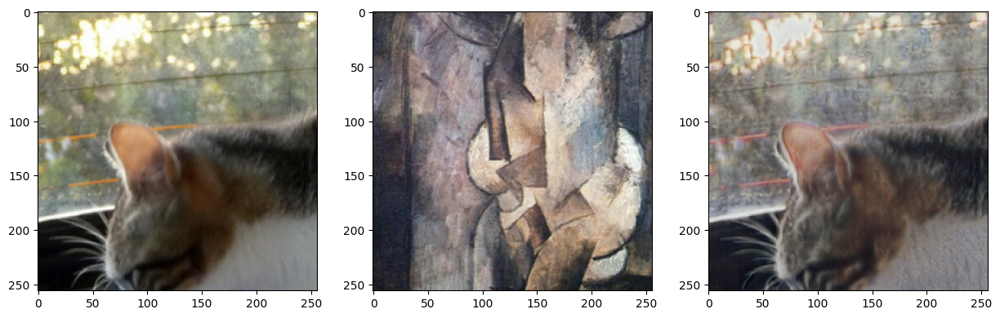

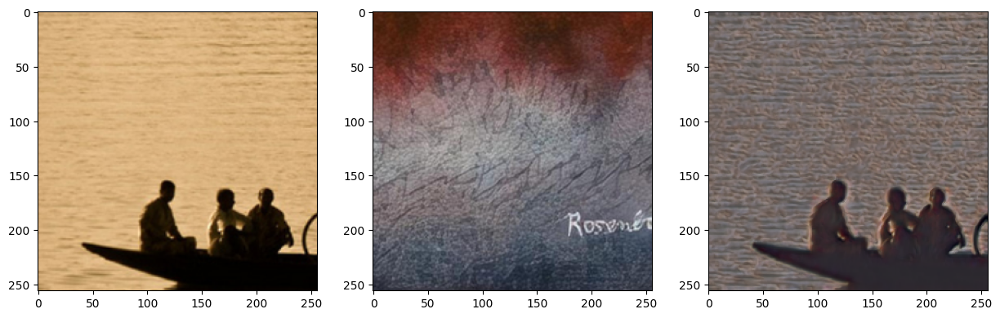

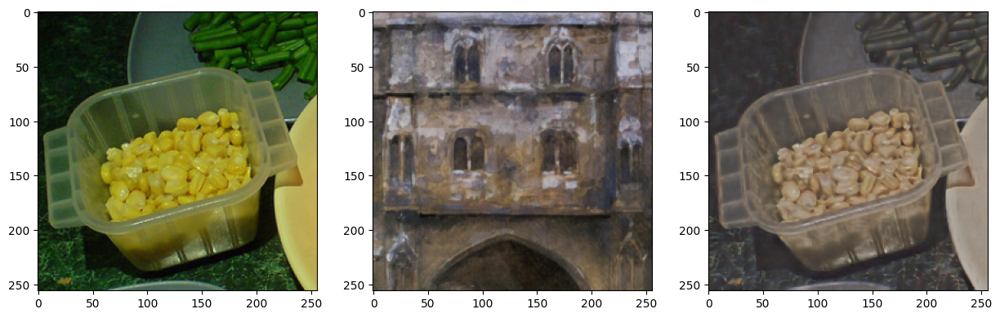

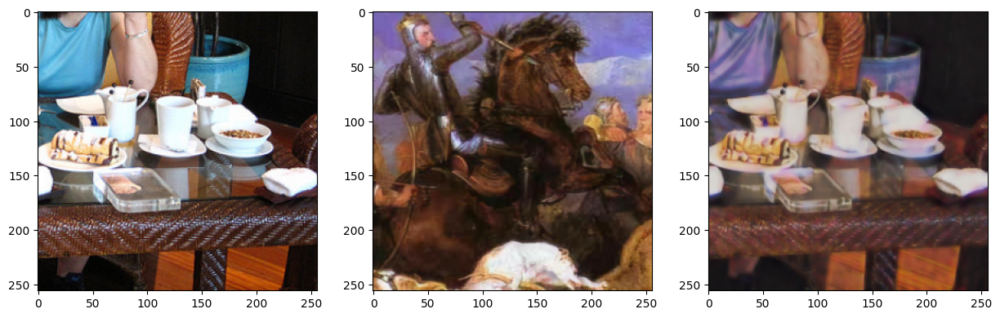

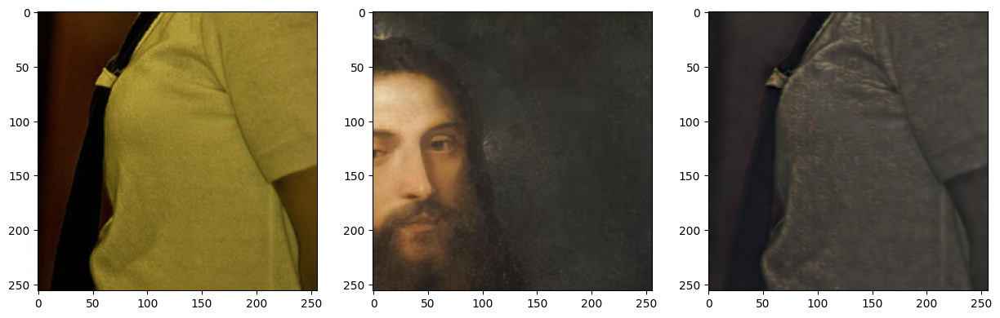

...

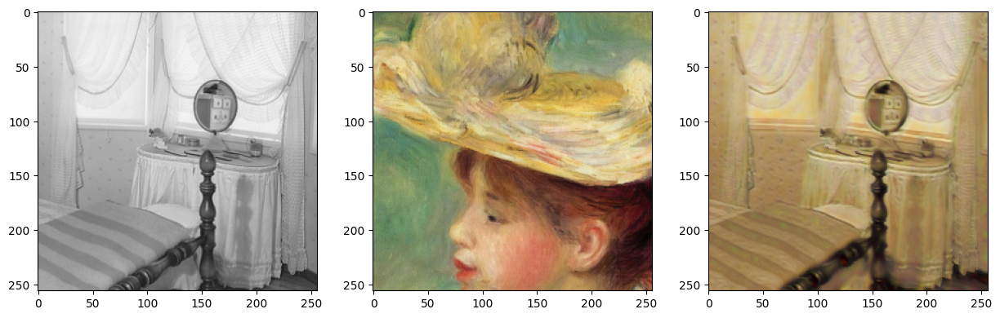

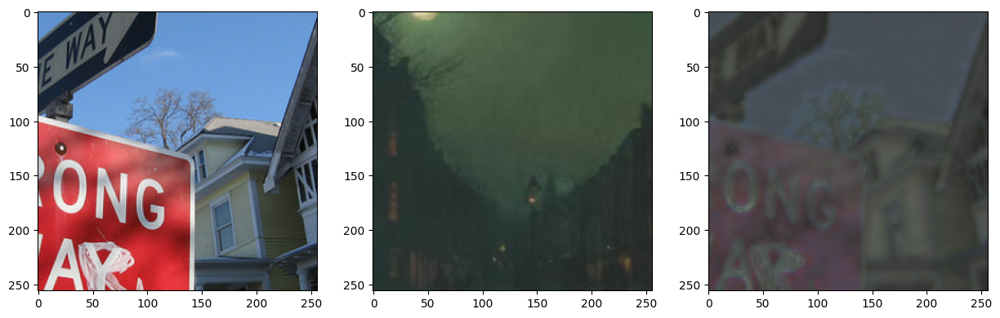

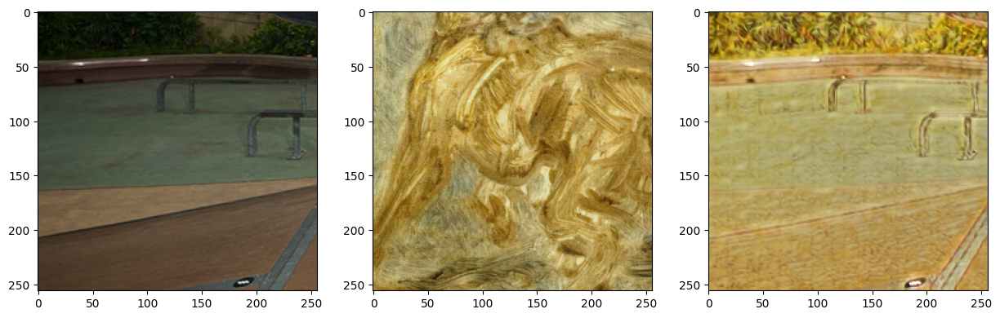

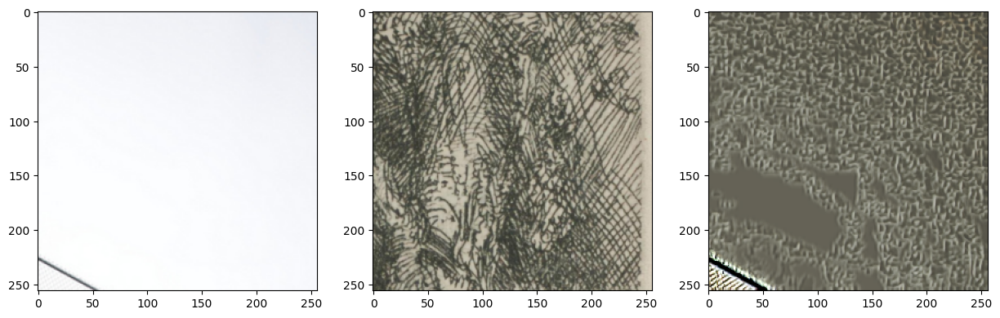

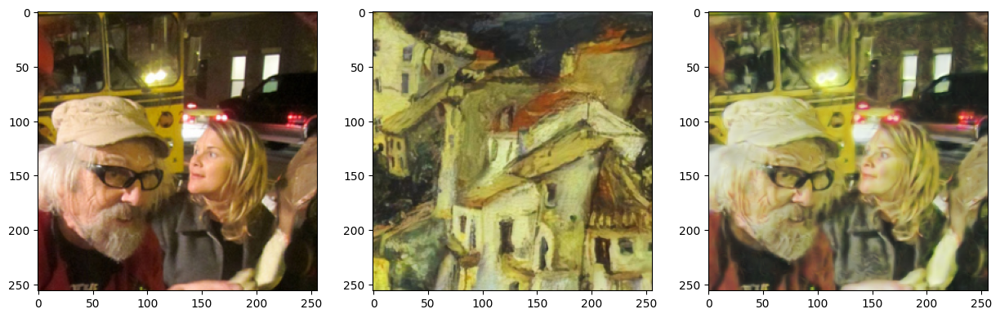

In [6]:
import matplotlib.pyplot as plt

for gen in imgs :
    fig, axs = plt.subplots(1,3, figsize=(15,5))
    for i in range(3) :
        axs[i].imshow(gen[i])
    plt.show()

In [7]:
wolf = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest.jpg')
van_gogh = Path('D:/StyleTransferAI/StyleTransferAI/test_images/van_gogh.jpg')
nature = Path('D:/StyleTransferAI/StyleTransferAI/test_images/nature.jpg')
wp = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wallpaper.jpg')
wolf_big = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest_big.jpg')
lion = Path('D:/StyleTransferAI/StyleTransferAI/test_images/lion.jpg')
fishes = Path('D:/StyleTransferAI/StyleTransferAI/test_images/peinture.webp')
drawing = Path('D:/StyleTransferAI/StyleTransferAI/test_images/croquis.jpg')

size = 1500

wolf_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(wolf))).unsqueeze(0)
sec_size = int((wolf_img.shape[2] / wolf_img.shape[1]) * size)
scaled_wolf = torch.nn.functional.interpolate(wolf_img.permute((0,3,1,2)), (size,sec_size), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

lion_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(lion))).unsqueeze(0)
sec_size_lion = int((lion_img.shape[2] / lion_img.shape[1]) * size)
scaled_lion = torch.nn.functional.interpolate(lion_img.permute((0,3,1,2)), (size,sec_size_lion), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

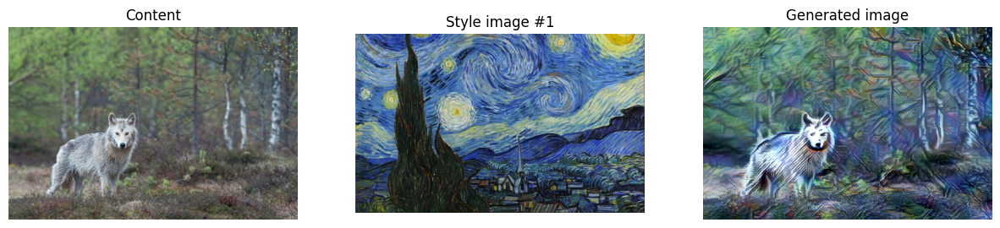

In [14]:
model.generate(wolf, van_gogh, show_img=True, show_inputs=True, resize_size=None)

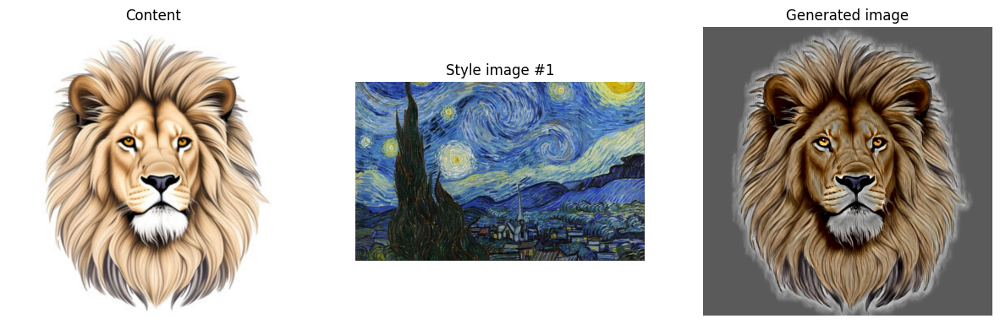

In [9]:
model.generate(scaled_lion, van_gogh, preserve_colors=True, show_img=True, show_inputs=True)

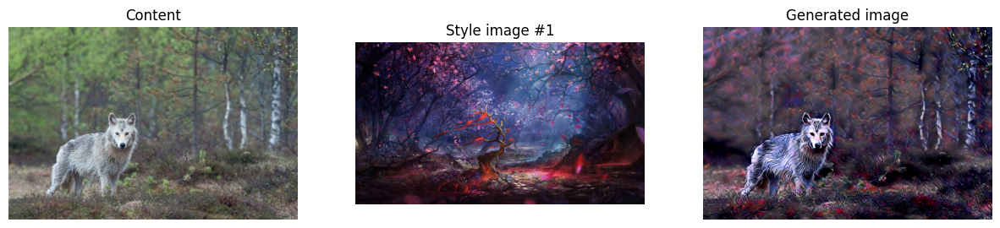

In [10]:
model.generate(wolf, wp, show_img=True, show_inputs=True)

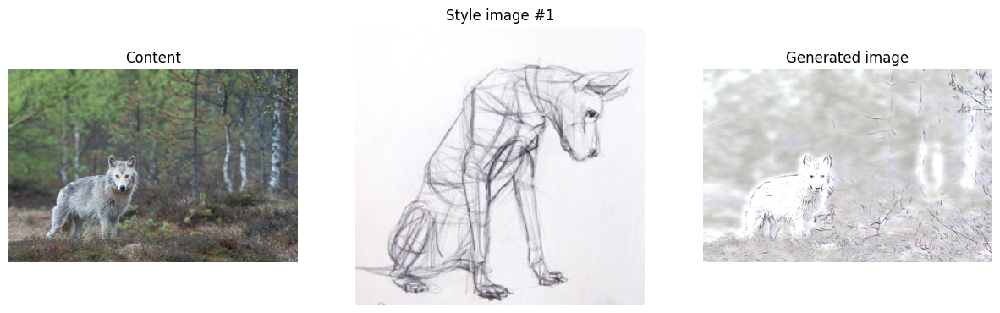

In [11]:
model.generate(wolf, drawing, show_img=True, show_inputs=True, style_scales=0.2)

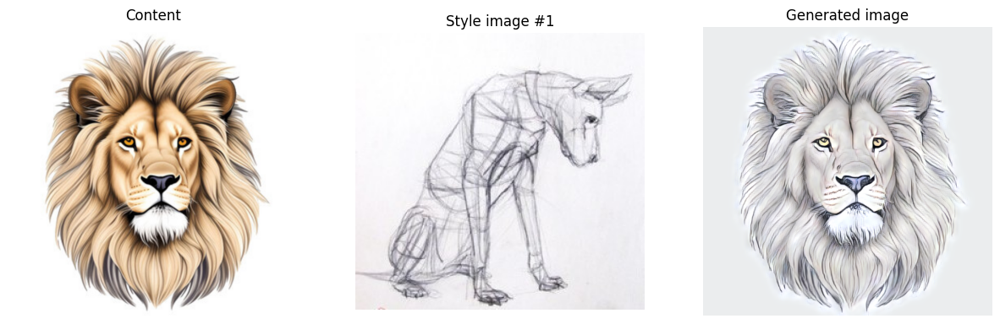

In [13]:
model.generate(scaled_lion, drawing, show_img=True, show_inputs=True, style_scales = 0.2)